https://www.kaggle.com/code/charanchandrasekaran/eda-for-classification-problem

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
data=pd.read_csv("train.csv")

In [6]:
data.head()

,ID,AGE,GENDER,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME,TYPE_OF_VEHICLE
0,816393,40-64,female,20-29y,university,middle class,0.638050,0.0,after 2015,0.0,0.0,37379,11000.0,0,0,0,0.0,Sports Car
1,251762,26-39,male,20-29y,high school,middle class,0.475741,1.0,before 2015,1.0,0.0,10238,9000.0,0,0,0,1.0,HatchBack
2,481952,40-64,male,20-29y,none,middle class,0.839817,1.0,before 2015,1.0,1.0,10238,12000.0,0,0,0,1.0,Sedan
3,3506,40-64,male,20-29y,high school,upper class,0.682527,1.0,before 2015,0.0,1.0,92099,6000.0,1,0,0,1.0,Sedan
4,498013,40-64,female,20-29y,none,working class,0.572184,1.0,after 2015,1.0,1.0,32122,15000.0,0,0,1,0.0,Sedan


In [7]:
data.shape

(105000, 18)

In [9]:
outcome= data.pop("OUTCOME")

In [10]:
data

,ID,AGE,GENDER,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,TYPE_OF_VEHICLE
0,816393,40-64,female,20-29y,university,middle class,0.638050,0.0,after 2015,0.0,0.0,37379,11000.0,0,0,0,Sports Car
1,251762,26-39,male,20-29y,high school,middle class,0.475741,1.0,before 2015,1.0,0.0,10238,9000.0,0,0,0,HatchBack
2,481952,40-64,male,20-29y,none,middle class,0.839817,1.0,before 2015,1.0,1.0,10238,12000.0,0,0,0,Sedan
3,3506,40-64,male,20-29y,high school,upper class,0.682527,1.0,before 2015,0.0,1.0,92099,6000.0,1,0,0,Sedan
4,498013,40-64,female,20-29y,none,working class,0.572184,1.0,after 2015,1.0,1.0,32122,15000.0,0,0,1,Sedan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104995,19557,65+,female,0-9y,high school,upper class,0.672255,1.0,before 2015,0.0,0.0,31885,9000.0,2,0,0,SUV
104996,222459,40-64,female,0-9y,none,working class,0.514193,1.0,after 2015,1.0,0.0,32277,10000.0,0,0,0,Sedan
104997,83089,16-25,male,10-19y,none,upper class,0.461942,1.0,after 2015,1.0,0.0,34800,11000.0,0,0,0,Sedan
104998,984879,40-64,female,20-29y,high school,working class,0.483571,1.0,before 2015,0.0,0.0,10238,10000.0,0,0,0,HatchBack


In [14]:
data.insert(17,"OUTCOME",outcome)

In [15]:
data.head()

,ID,AGE,GENDER,DRIVING_EXPERIENCE,EDUCATION,INCOME,CREDIT_SCORE,VEHICLE_OWNERSHIP,VEHICLE_YEAR,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,TYPE_OF_VEHICLE,OUTCOME
0,816393,40-64,female,20-29y,university,middle class,0.638050,0.0,after 2015,0.0,0.0,37379,11000.0,0,0,0,Sports Car,0.0
1,251762,26-39,male,20-29y,high school,middle class,0.475741,1.0,before 2015,1.0,0.0,10238,9000.0,0,0,0,HatchBack,1.0
2,481952,40-64,male,20-29y,none,middle class,0.839817,1.0,before 2015,1.0,1.0,10238,12000.0,0,0,0,Sedan,1.0
3,3506,40-64,male,20-29y,high school,upper class,0.682527,1.0,before 2015,0.0,1.0,92099,6000.0,1,0,0,Sedan,1.0
4,498013,40-64,female,20-29y,none,working class,0.572184,1.0,after 2015,1.0,1.0,32122,15000.0,0,0,1,Sedan,0.0


In [16]:
  data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105000 entries, 0 to 104999
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   105000 non-null  int64  
 1   AGE                  105000 non-null  object 
 2   GENDER               105000 non-null  object 
 3   DRIVING_EXPERIENCE   105000 non-null  object 
 4   EDUCATION            105000 non-null  object 
 5   INCOME               105000 non-null  object 
 6   CREDIT_SCORE         105000 non-null  float64
 7   VEHICLE_OWNERSHIP    105000 non-null  float64
 8   VEHICLE_YEAR         105000 non-null  object 
 9   MARRIED              105000 non-null  float64
 10  CHILDREN             105000 non-null  float64
 11  POSTAL_CODE          105000 non-null  int64  
 12  ANNUAL_MILEAGE       105000 non-null  float64
 13  SPEEDING_VIOLATIONS  105000 non-null  int64  
 14  DUIS                 105000 non-null  int64  
 15  PAST_ACCIDENTS   

In [17]:
data.describe()

,ID,CREDIT_SCORE,VEHICLE_OWNERSHIP,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
count,105000.000000,105000.000000,105000.000000,105000.000000,105000.000000,105000.000000,105000.000000,105000.000000,105000.000000,105000.000000,105000.000000
mean,394931.295905,0.602173,0.827038,0.584143,0.520000,18045.439267,11061.228571,0.675676,0.129733,0.549314,0.422648
std,279694.106053,0.138045,0.378216,0.492871,0.499602,16709.040449,2972.355482,1.383678,0.589714,1.402809,0.493983
min,101.000000,0.066880,0.000000,0.000000,0.000000,10238.000000,2000.000000,0.000000,0.000000,0.000000,0.000000
25%,156351.750000,0.514876,1.000000,0.000000,0.000000,10238.000000,9000.000000,0.000000,0.000000,0.000000,0.000000
50%,354679.500000,0.601112,1.000000,1.000000,1.000000,10238.000000,11000.000000,0.000000,0.000000,0.000000,0.000000
75%,598602.250000,0.703216,1.000000,1.000000,1.000000,22957.750000,13000.000000,1.000000,0.000000,0.000000,1.000000
max,999976.000000,0.954075,1.000000,1.000000,1.000000,92101.000000,21000.000000,20.000000,6.000000,15.000000,1.000000


In [18]:
numerical_data=data.select_dtypes(include="number")
numerical_features=numerical_data.columns.tolist()

In [25]:
len(numerical_features)

11

In [28]:
numerical_features

['ID',
 'CREDIT_SCORE',
 'VEHICLE_OWNERSHIP',
 'MARRIED',
 'CHILDREN',
 'POSTAL_CODE',
 'ANNUAL_MILEAGE',
 'SPEEDING_VIOLATIONS',
 'DUIS',
 'PAST_ACCIDENTS',
 'OUTCOME']

In [32]:
catogorical_data=data.select_dtypes(include='object')
catogorical_features=catogorical_data.columns.tolist()

In [33]:
catogorical_features

['AGE',
 'GENDER',
 'DRIVING_EXPERIENCE',
 'EDUCATION',
 'INCOME',
 'VEHICLE_YEAR',
 'TYPE_OF_VEHICLE']

In [37]:
numerical_data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,105000.0,394931.295905,279694.106053,101.00000,156351.750000,354679.500000,598602.250000,999976.000000
CREDIT_SCORE,105000.0,0.602173,0.138045,0.06688,0.514876,0.601112,0.703216,0.954075
VEHICLE_OWNERSHIP,105000.0,0.827038,0.378216,0.00000,1.000000,1.000000,1.000000,1.000000
MARRIED,105000.0,0.584143,0.492871,0.00000,0.000000,1.000000,1.000000,1.000000
CHILDREN,105000.0,0.520000,0.499602,0.00000,0.000000,1.000000,1.000000,1.000000
POSTAL_CODE,105000.0,18045.439267,16709.040449,10238.00000,10238.000000,10238.000000,22957.750000,92101.000000
ANNUAL_MILEAGE,105000.0,11061.228571,2972.355482,2000.00000,9000.000000,11000.000000,13000.000000,21000.000000
SPEEDING_VIOLATIONS,105000.0,0.675676,1.383678,0.00000,0.000000,0.000000,1.000000,20.000000
DUIS,105000.0,0.129733,0.589714,0.00000,0.000000,0.000000,0.000000,6.000000
PAST_ACCIDENTS,105000.0,0.549314,1.402809,0.00000,0.000000,0.000000,0.000000,15.000000


Here are some key insights derived from the provided data summary:

### **General Overview**
- **Total Records:** 105,000 data points, indicating a sizable dataset suitable for robust analysis.

---

### **Key Feature Analysis**
1. **ID**
   - Appears to be a unique identifier for records, with no direct impact on model performance unless there's a pattern in ID sequences.

2. **CREDIT_SCORE**
   - **Mean:** ~0.60 with a **standard deviation** of ~0.14.
   - The distribution appears slightly skewed toward higher credit scores, with most values between **0.51** and **0.70**.
   - **Min value** (~0.06688) indicates some extremely low credit scores, possibly outliers.

3. **VEHICLE_OWNERSHIP**
   - **Mean:** ~0.83 suggests that **83%** of individuals own a vehicle.
   - The distribution is strongly skewed toward ownership, with a majority having a value of **1** (ownership).

4. **MARRIED**
   - **Mean:** ~0.58 indicates that **58%** of individuals are married.
   - The binary nature (0 or 1) suggests a well-balanced distribution but slightly leaning toward the married group.

5. **CHILDREN**
   - **Mean:** ~0.52 indicates that around **52%** of individuals have children.
   - The balanced distribution suggests no significant dominance of one class.

6. **POSTAL_CODE**
   - Large variance in values, suggesting a wide geographic spread.
   - The **minimum** (10,238) and **maximum** (92,101) imply diverse locations, possibly spanning different socioeconomic areas.

7. **ANNUAL_MILEAGE**
   - **Mean:** ~11,061 miles with a **wide range** (2,000 to 21,000 miles).
   - The interquartile range (IQR) from **9,000** to **13,000** suggests most individuals travel within this range.

8. **SPEEDING_VIOLATIONS**
   - **Mean:** ~0.67 but with a maximum value of **20**.
   - A small portion of individuals have extremely high numbers of violations, suggesting possible high-risk drivers.

9. **DUIS (Driving Under the Influence)**
   - **Mean:** ~0.13 with a **maximum** of **6** DUIs.
   - While the mean is low, some individuals have multiple offenses, indicating potential high-risk behavior.

10. **PAST_ACCIDENTS**
   - **Mean:** ~0.55 but with a **maximum** of **15**.
   - Most individuals have few or no accidents, but a small portion shows high accident history.

11. **OUTCOME (Target Variable)**
   - **Mean:** ~0.42 indicates that about **42%** of cases have a positive outcome (likely an event of interest, such as an insurance claim or a specific condition).

---

### **Key Takeaways**
✅ The dataset seems well-distributed across multiple variables.  
✅ Potential outliers exist in features like **CREDIT_SCORE**, **SPEEDING_VIOLATIONS**, **DUIS**, and **PAST_ACCIDENTS** — these may require further inspection.  
✅ Features like **VEHICLE_OWNERSHIP**, **MARRIED**, and **CHILDREN** appear relatively balanced but lean toward higher values.  
✅ The target variable (**OUTCOME**) shows a reasonable class distribution with ~42% positives, suggesting potential challenges in ensuring balanced model performance.  

Would you like visualizations, correlation analysis, or feature engineering suggestions for deeper insights?

In [36]:
catogorical_data.describe().T

,count,unique,top,freq
AGE,105000,4,40-64,33716
GENDER,105000,2,male,65317
DRIVING_EXPERIENCE,105000,4,20-29y,37493
EDUCATION,105000,3,high school,46590
INCOME,105000,4,upper class,51271
VEHICLE_YEAR,105000,2,before 2015,57511
TYPE_OF_VEHICLE,105000,4,Sports Car,34592


Here are the insights drawn from the provided categorical data:

### **1. AGE**
- **Most common group:** `40-64` with **33,716** individuals.
- The dataset covers **4 age groups**, likely categorized as: `<=25`, `26-39`, `40-64`, `65+`.
- The dominance of the `40-64` age group suggests a focus on middle-aged individuals.

---

### **2. GENDER**
- **Most common category:** `Male` with **65,317** entries (~62%).
- There’s a notable gender imbalance with males being the majority. This may impact feature importance in predictive models.

---

### **3. DRIVING_EXPERIENCE**
- **Most common group:** `20-29y` with **37,493** individuals.
- The presence of **4 categories** suggests experience ranges like `0-9y`, `10-19y`, `20-29y`, and `30+ years`.
- The dominance of this group may reflect that many drivers are relatively experienced but not yet at the highest experience level.

---

### **4. EDUCATION**
- **Most common category:** `High School` with **46,590** entries (~44%).
- The dataset appears to have three educational levels, possibly `High School`, `College`, and `Postgraduate`.
- The high proportion of individuals with only a high school education might correlate with other socioeconomic factors.

---

### **5. INCOME**
- **Most common group:** `Upper Class` with **51,271** individuals (~49%).
- The presence of **4 categories** suggests divisions like `Low`, `Middle`, `Upper-Middle`, and `Upper Class`.
- The concentration in the upper-income range may indicate a target group for insurance or financial services.

---

### **6. VEHICLE_YEAR**
- **Most common category:** `Before 2015` with **57,511** entries (~55%).
- This suggests that a significant portion of vehicles are older models, which may correlate with higher maintenance costs or insurance risk.

---

### **7. TYPE_OF_VEHICLE**
- **Most common type:** `Sports Car` with **34,592** entries (~33%).
- The dataset includes **4 types**, likely combining vehicle categories like `Sedan`, `SUV`, `Truck`, and `Sports Car`.
- The high percentage of sports cars may correlate with riskier driving behavior.

---

### **Key Takeaways**
✅ Strong dominance in groups like **40-64 years**, **Males**, and **Upper Class**, indicating potential demographic trends.  
✅ Features like **VEHICLE_YEAR** and **TYPE_OF_VEHICLE** may significantly impact risk assessment or insurance outcomes.  
✅ Possible imbalances in categories (e.g., gender, education) might requiatures may influence your target variable (`OUTCOME`)?

In [38]:
numerical_data.var()

ID                     7.822879e+10
CREDIT_SCORE           1.905653e-02
VEHICLE_OWNERSHIP      1.430474e-01
MARRIED                2.429223e-01
CHILDREN               2.496024e-01
POSTAL_CODE            2.791920e+08
ANNUAL_MILEAGE         8.834897e+06
SPEEDING_VIOLATIONS    1.914566e+00
DUIS                   3.477631e-01
PAST_ACCIDENTS         1.967873e+00
OUTCOME                2.440189e-01
dtype: float64

### **Insights from Numerical Data Variance Analysis**

Variance measures the spread of data points from the mean. Higher variance indicates greater dispersion, while lower variance suggests data points are closely packed.

---

### **Key Observations**
1. **ID** (`7.82e+10`)
   - Extremely high variance, expected for unique identifiers. This column likely has no predictive value and may need to be dropped.

2. **CREDIT_SCORE** (`0.019`)
   - **Low variance** indicates values are tightly clustered around the mean. Despite this, small variations may still hold significant importance in predictive models. Feature scaling (like MinMax or StandardScaler) may improve model performance.

3. **VEHICLE_OWNERSHIP** (`0.143`)
   - As a binary feature (0 or 1), this variance is moderate, suggesting a fair balance between ownership categories.

4. **MARRIED** (`0.243`) and **CHILDREN** (`0.249`)
   - Both features have a similar variance, indicating near-even distribution between `0` and `1`.

5. **POSTAL_CODE** (`2.79e+08`)
   - High variance suggests a wide range of geographical data. This feature may require transformation (e.g., grouping by region or using geospatial encoding).

6. **ANNUAL_MILEAGE** (`8.83e+06`)
   - Significant variance aligns with the broad range of mileage values (from **2,000** to **21,000**). Consider normalizing or binning for better model performance.

7. **SPEEDING_VIOLATIONS** (`1.91`) and **PAST_ACCIDENTS** (`1.97`)
   - High variance indicates that some individuals have significantly more violations/accidents than others. These may act as key predictors in risk-based models.

8. **DUIS** (`0.347`)
   - Moderate variance, reflecting that while most values are zero, some individuals have multiple DUI records.

9. **OUTCOME** (`0.244`)
   - Since this is a binary target variable (0 or 1), the variance value (~0.25) aligns with a fairly balanced dataset (42% positive class).

---

### **Key Recommendations**
✅ **Drop `ID`** as it provides no useful predictive value.  
✅ For high-variance features like **POSTAL_CODE** and **ANNUAL_MILEAGE**, consider scaling or feature engineering to improve interpretability.  
✅ Features with lower variance like **CREDIT_SCORE** may still carry significant predictive power; apply scaling to enhance their impact.  
✅ For binary features such as **MARRIED**, **CHILDREN**, and **VEHICLE_OWNERSHIP**, variance indicates reasonably balanced distributions — no urgent transformation needed.

Would you like guidance on feature engineering, encoding techniques, or model selection strategies based on these insights?

In [39]:
numerical_data.skew()

ID                     0.448392
CREDIT_SCORE          -0.226358
VEHICLE_OWNERSHIP     -1.729404
MARRIED               -0.341446
CHILDREN              -0.080065
POSTAL_CODE            2.986882
ANNUAL_MILEAGE        -0.510118
SPEEDING_VIOLATIONS    3.899817
DUIS                   5.608688
PAST_ACCIDENTS         4.345520
OUTCOME                0.313184
dtype: float64

### **Insights from Numerical Data Skewness Analysis**

**Skewness** measures the asymmetry of data distribution.  
- **Positive skew (> 0):** Data is skewed right (longer tail on the right).  
- **Negative skew (< 0):** Data is skewed left (longer tail on the left).  
- **Near zero skew (~0):** Data is symmetric (normal distribution).  

---

### **Key Observations & Recommendations**
1. **ID** (`0.448`)
   - Slight positive skew. Since this is an identifier, it should be dropped during modeling.

2. **CREDIT_SCORE** (`-0.226`)
   - Slight negative skew, indicating values are marginally concentrated toward higher credit scores.  
   **Recommendation:** No urgent transformation is needed, but scaling may improve performance.

3. **VEHICLE_OWNERSHIP** (`-1.729`)
   - Strong negative skew, suggesting most individuals own a vehicle.  
   **Recommendation:** May need transformation (e.g., `log`, `sqrt`) if the imbalance affects model learning.

4. **MARRIED** (`-0.341`) and **CHILDREN** (`-0.080`)
   - Mild negative skew, indicating slight dominance of married individuals and those with children.  
   **Recommendation:** These values are reasonably balanced; no major transformation needed.

5. **POSTAL_CODE** (`2.986`)
   - Strong positive skew, suggesting a concentration of values at the lower end with some extreme values.  
   **Recommendation:** Consider **log transformation** or **binning** for improved distribution.

6. **ANNUAL_MILEAGE** (`-0.510`)
   - Slight negative skew, indicating more individuals with lower mileage.  
   **Recommendation:** Scaling or slight transformation (like `sqrt`) may improve model performance.

7. **SPEEDING_VIOLATIONS** (`3.899`)  
8. **DUIS** (`5.608`)  
9. **PAST_ACCIDENTS** (`4.345`)  
   - All three features exhibit **high positive skew**, indicating most values are near zero, but a small number have exceptionally high counts.  
   **Recommendation:**  
   ✅ Apply **log(x + 1)** transformation to reduce skew.  
   ✅ Alternatively, **binning** or **clipping outliers** can help stabilize these features.

10. **OUTCOME** (`0.313`)
   - Slight positive skew, which is typical for a target variable with a **42% positive class**.  
   **Recommendation:** No urgent transformation needed, but stratified sampling may improve model performance.

---

### **Actionable Summary**
✅ **Drop `ID`** as it adds no predictive value.  
✅ Apply **log transformation** to skewed features like **POSTAL_CODE**, **SPEEDING_VIOLATIONS**, **DUIS**, and **PAST_ACCIDENTS**.  
✅ Consider **scaling** for features with mild skew such as **CREDIT_SCORE** and **ANNUAL_MILEAGE**.  
✅ For binary features like **MARRIED**, **CHILDREN**, and **VEHICLE_OWNERSHIP**, no transformation is necessary unless imbalance causes model bias.  

Would you like code snippets for implementing these transformations or further analysis techniques like correlation heatmaps or feature selection strategies?

array([[<Axes: title={'center': 'ID'}>,
        <Axes: title={'center': 'CREDIT_SCORE'}>,
        <Axes: title={'center': 'VEHICLE_OWNERSHIP'}>],
       [<Axes: title={'center': 'MARRIED'}>,
        <Axes: title={'center': 'CHILDREN'}>,
        <Axes: title={'center': 'POSTAL_CODE'}>],
       [<Axes: title={'center': 'ANNUAL_MILEAGE'}>,
        <Axes: title={'center': 'SPEEDING_VIOLATIONS'}>,
        <Axes: title={'center': 'DUIS'}>],
       [<Axes: title={'center': 'PAST_ACCIDENTS'}>,
        <Axes: title={'center': 'OUTCOME'}>, <Axes: >]], dtype=object)

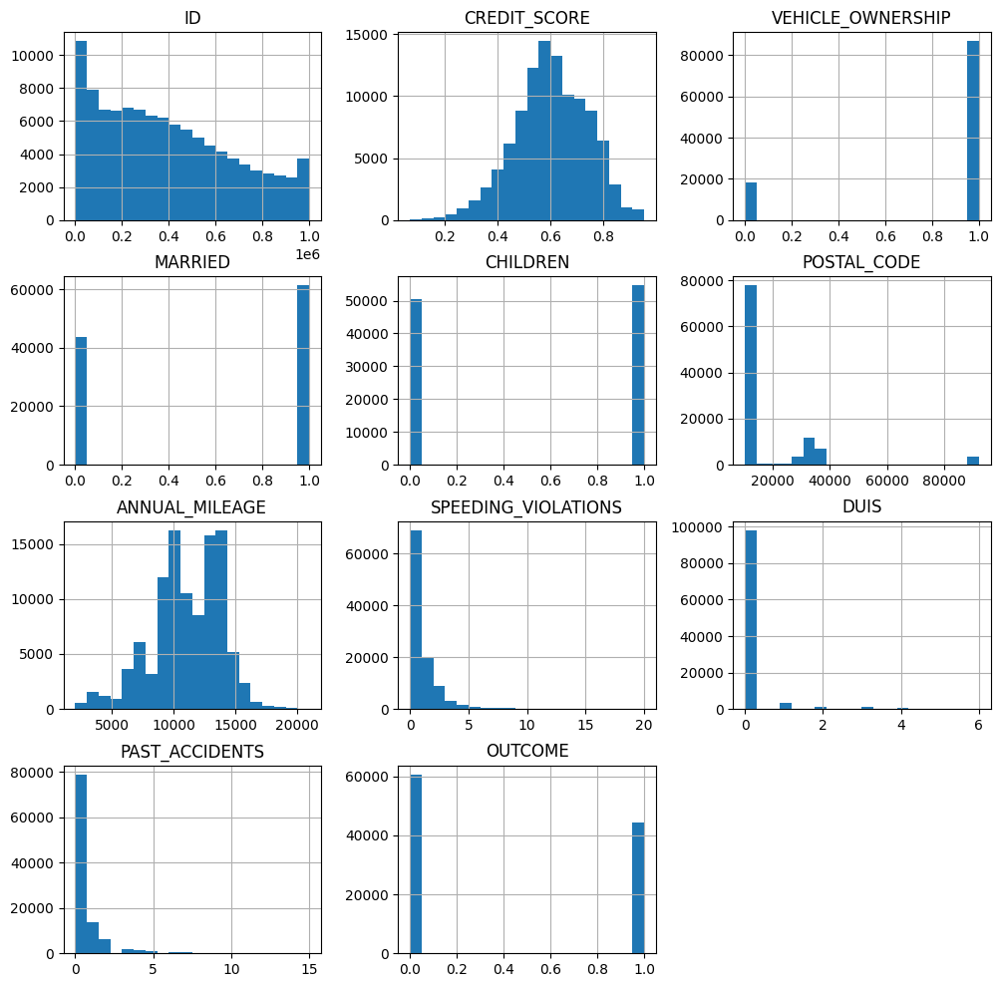

In [42]:
numerical_data.hist(figsize=(12,12), bins=20)

In [43]:
numerical_data.nunique()


ID                      98485
CREDIT_SCORE           104976
VEHICLE_OWNERSHIP           2
MARRIED                     2
CHILDREN                    2
POSTAL_CODE             10937
ANNUAL_MILEAGE             20
SPEEDING_VIOLATIONS        21
DUIS                        7
PAST_ACCIDENTS             16
OUTCOME                     2
dtype: int64

In [49]:
numerical_data.isnull().sum()

ID                     0
CREDIT_SCORE           0
VEHICLE_OWNERSHIP      0
MARRIED                0
CHILDREN               0
POSTAL_CODE            0
ANNUAL_MILEAGE         0
SPEEDING_VIOLATIONS    0
DUIS                   0
PAST_ACCIDENTS         0
OUTCOME                0
dtype: int64

In [51]:
catogorical_data.nunique()

AGE                   4
GENDER                2
DRIVING_EXPERIENCE    4
EDUCATION             3
INCOME                4
VEHICLE_YEAR          2
TYPE_OF_VEHICLE       4
dtype: int64


{'AGE'}


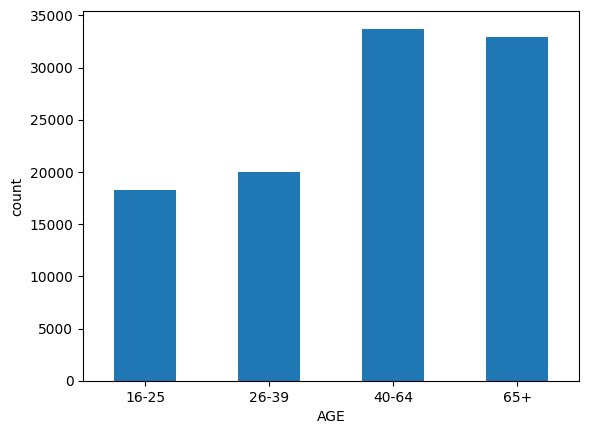


{'GENDER'}


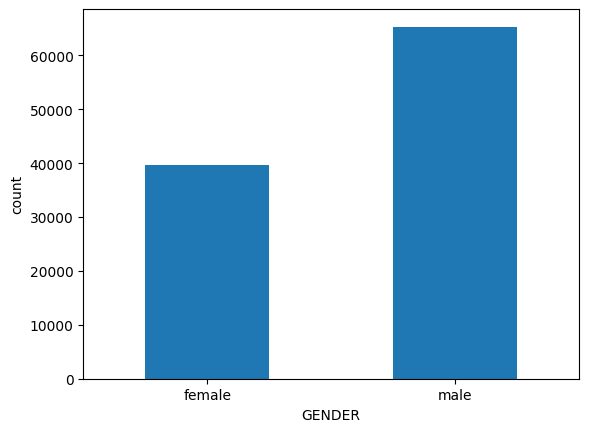


{'DRIVING_EXPERIENCE'}


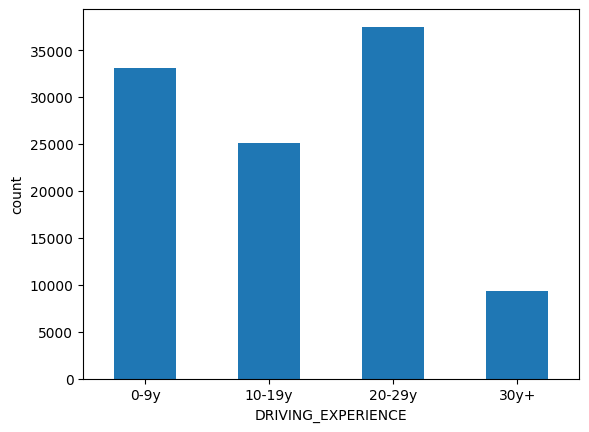


{'EDUCATION'}


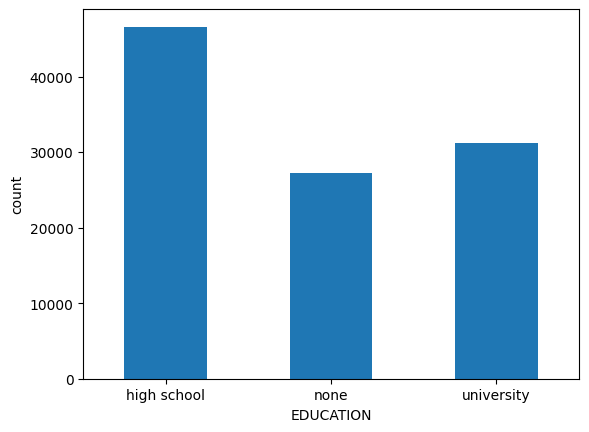


{'INCOME'}


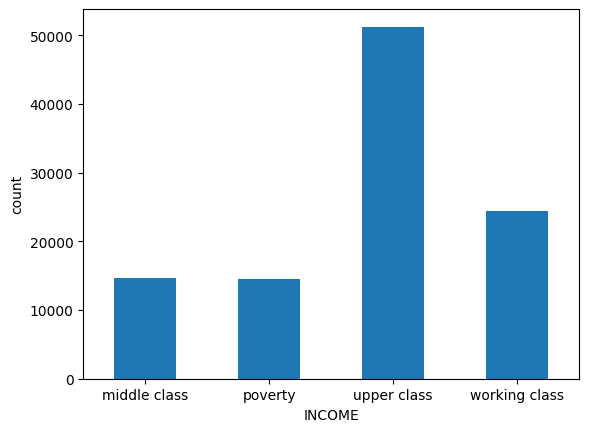


{'VEHICLE_YEAR'}


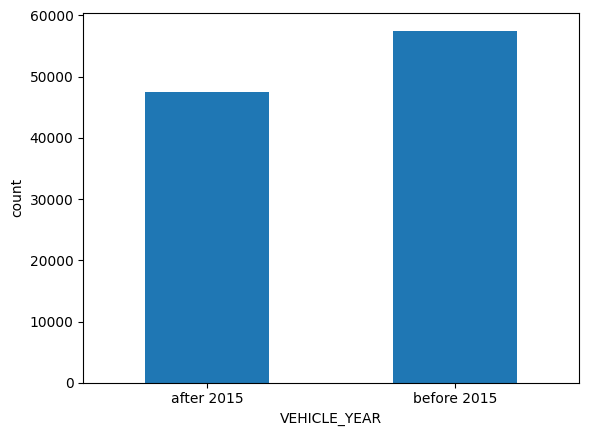


{'TYPE_OF_VEHICLE'}


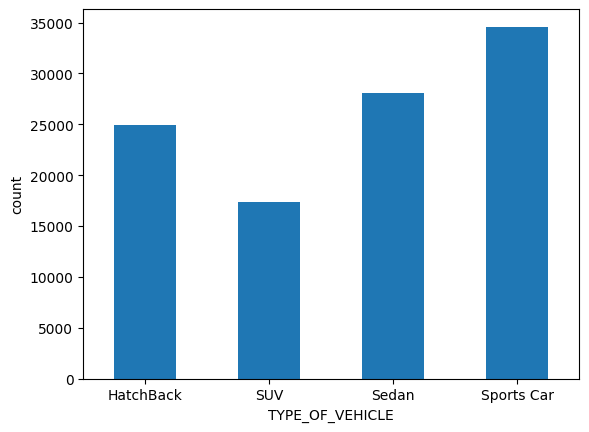

In [63]:
for col in catogorical_features:
    print()
    print({col}) #print column name above the plot
    catogorical_data[col].value_counts().sort_index().plot(kind='bar', rot=0, xlabel=col,ylabel='count')
    plt.show()

In [72]:
correlation = numerical_data.corr().round(3)

In [73]:
correlation


,ID,CREDIT_SCORE,VEHICLE_OWNERSHIP,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
ID,1.000,0.006,-0.012,-0.018,-0.006,0.006,-0.010,-0.008,0.002,0.008,-0.002
CREDIT_SCORE,0.006,1.000,0.005,-0.000,-0.000,-0.006,-0.020,-0.009,0.005,-0.006,-0.003
VEHICLE_OWNERSHIP,-0.012,0.005,1.000,-0.005,0.006,-0.001,0.005,-0.005,0.003,0.001,-0.003
MARRIED,-0.018,-0.000,-0.005,1.000,-0.002,0.004,0.001,0.005,0.002,0.005,-0.006
CHILDREN,-0.006,-0.000,0.006,-0.002,1.000,-0.005,0.005,0.001,0.002,-0.006,0.002
POSTAL_CODE,0.006,-0.006,-0.001,0.004,-0.005,1.000,0.007,0.008,0.008,0.009,-0.003
ANNUAL_MILEAGE,-0.010,-0.020,0.005,0.001,0.005,0.007,1.000,-0.004,0.004,-0.004,-0.001
SPEEDING_VIOLATIONS,-0.008,-0.009,-0.005,0.005,0.001,0.008,-0.004,1.000,0.006,0.005,0.000
DUIS,0.002,0.005,0.003,0.002,0.002,0.008,0.004,0.006,1.000,0.004,0.000
PAST_ACCIDENTS,0.008,-0.006,0.001,0.005,-0.006,0.009,-0.004,0.005,0.004,1.000,-0.002


In [77]:
correlation.style.background_gradient(cmap='copper')

,ID,CREDIT_SCORE,VEHICLE_OWNERSHIP,MARRIED,CHILDREN,POSTAL_CODE,ANNUAL_MILEAGE,SPEEDING_VIOLATIONS,DUIS,PAST_ACCIDENTS,OUTCOME
ID,1.000000,0.006000,-0.012000,-0.018000,-0.006000,0.006000,-0.010000,-0.008000,0.002000,0.008000,-0.002000
CREDIT_SCORE,0.006000,1.000000,0.005000,-0.000000,-0.000000,-0.006000,-0.020000,-0.009000,0.005000,-0.006000,-0.003000
VEHICLE_OWNERSHIP,-0.012000,0.005000,1.000000,-0.005000,0.006000,-0.001000,0.005000,-0.005000,0.003000,0.001000,-0.003000
MARRIED,-0.018000,-0.000000,-0.005000,1.000000,-0.002000,0.004000,0.001000,0.005000,0.002000,0.005000,-0.006000
CHILDREN,-0.006000,-0.000000,0.006000,-0.002000,1.000000,-0.005000,0.005000,0.001000,0.002000,-0.006000,0.002000
POSTAL_CODE,0.006000,-0.006000,-0.001000,0.004000,-0.005000,1.000000,0.007000,0.008000,0.008000,0.009000,-0.003000
ANNUAL_MILEAGE,-0.010000,-0.020000,0.005000,0.001000,0.005000,0.007000,1.000000,-0.004000,0.004000,-0.004000,-0.001000
SPEEDING_VIOLATIONS,-0.008000,-0.009000,-0.005000,0.005000,0.001000,0.008000,-0.004000,1.000000,0.006000,0.005000,0.000000
DUIS,0.002000,0.005000,0.003000,0.002000,0.002000,0.008000,0.004000,0.006000,1.000000,0.004000,0.000000
PAST_ACCIDENTS,0.008000,-0.006000,0.001000,0.005000,-0.006000,0.009000,-0.004000,0.005000,0.004000,1.000000,-0.002000


<Axes: >

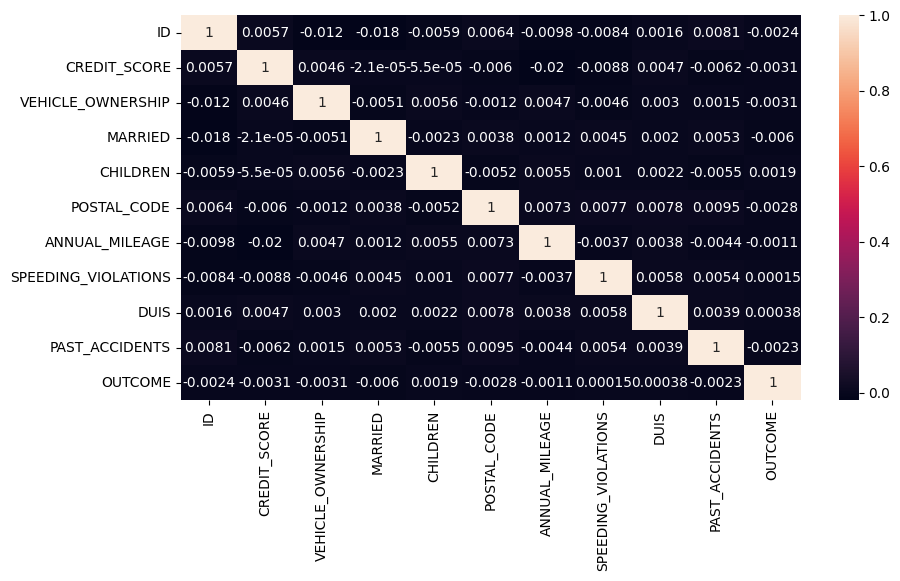

In [87]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.heatmap(numerical_data.corr(), ax=ax,annot=True)

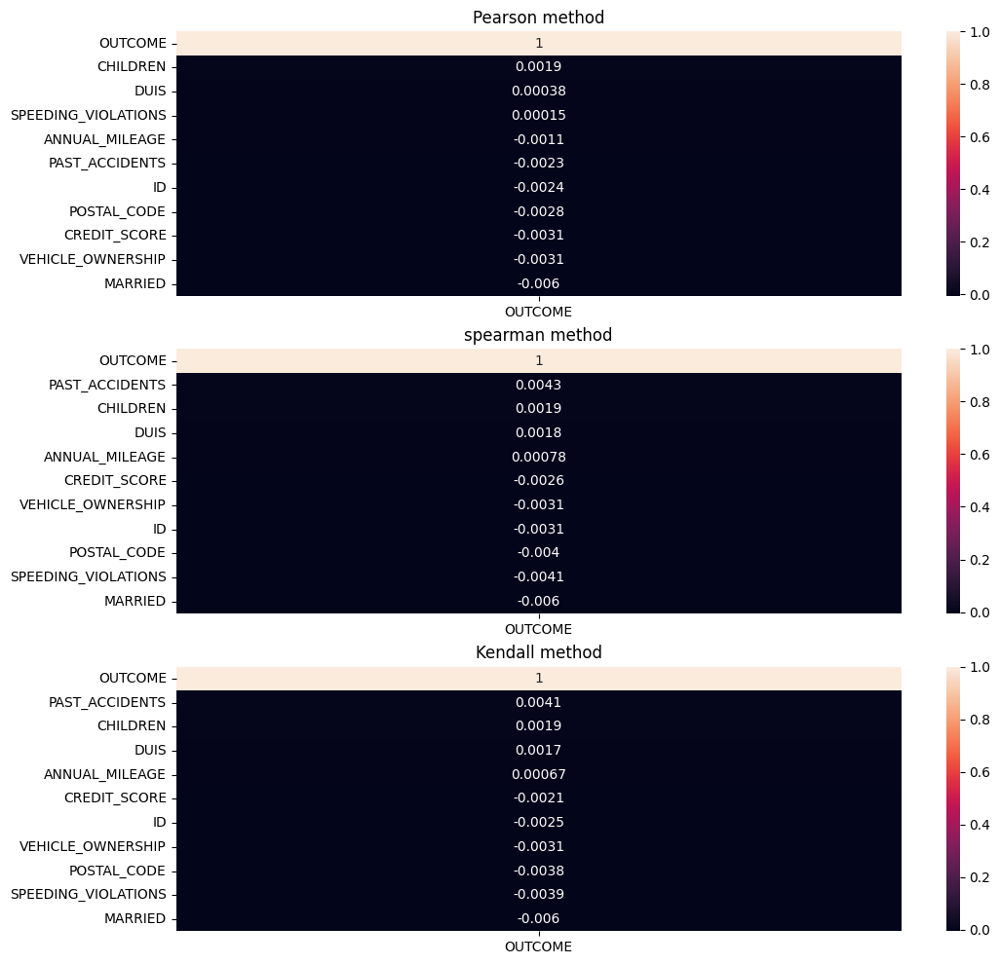

In [91]:
fig, ax = plt.subplots(3,1, figsize=(12, 12))
## Correlation coefficient using different methods
corr1 = numerical_data.corr('pearson')[['OUTCOME']].sort_values(by='OUTCOME', ascending=False)
corr2 = numerical_data.corr('spearman')[['OUTCOME']].sort_values(by='OUTCOME', ascending=False)
corr3 = numerical_data.corr('kendall')[['OUTCOME']].sort_values(by='OUTCOME', ascending=False)

#setting titles for each plot
ax[0].set_title('Pearson method')
ax[1].set_title('spearman method')
ax[2].set_title('Kendall method')
## Generating heatmaps of each methods
sns.heatmap(corr1, ax=ax[0], annot=True)
sns.heatmap(corr2, ax=ax[1], annot=True)
sns.heatmap(corr3, ax=ax[2], annot=True)

plt.show()

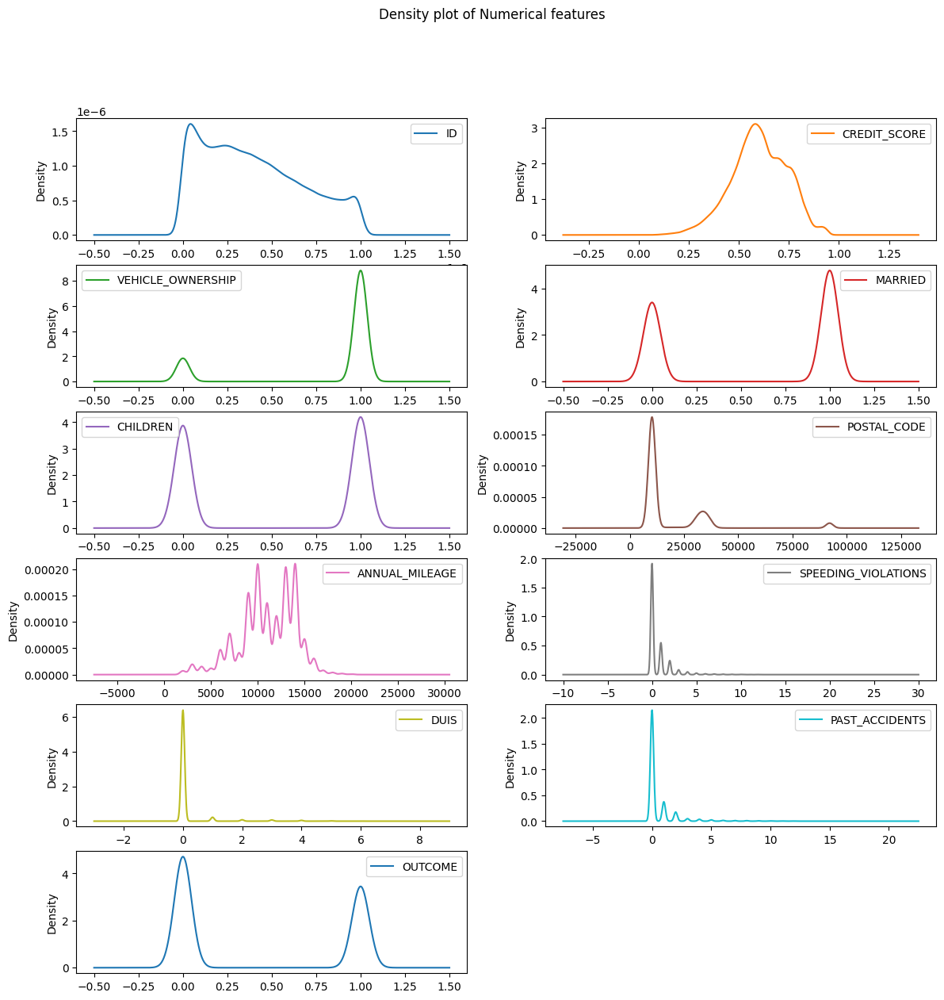

In [93]:
numerical_data.plot(kind='density',figsize=(14,14),subplots=True,layout=(6,2),title="Density plot of Numerical features",sharex=False)
plt.show()

In [94]:
import sys
!{sys.executable} -m pip install pandas-profiling


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/4.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/4.7 MB ? eta -:--:--
   -- ------------------------------------- 0.3/4.7 MB ? eta -:--:--
   ---- ----------------------------------- 0.5/4.7 MB 1.0 MB/s eta 0:00:05
   ---- ----------------------------------- 0.5/4.7 MB 1.0 MB/s eta 0:00:05
   ------ --------------------------------- 0.8/4.7 MB 745.8 kB/s eta 0:00:06
   -------- ------------------------------- 1.0/4.7 MB 883.6 kB/s eta 0:00:05
   ----------- ---------------------------- 1.3/4.7 MB 919.8 kB/s eta 0:00:04
   ------------- -------------------------- 1.6/4.7 MB 1.0 MB/s eta 0:00:04
   ----------------- ---------------------- 2.1/4.7 MB 1.2 MB/s eta 0:00:03
   ------------------- -------------------- 2.4/4.7 MB 1.1 MB/s eta 0:00:03
   ------------------- -------------------- 2.4/4.7 MB 1.1 MB/s eta 0:00:03


In [95]:
!pip install -U pandas-profiling


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [96]:
import pandas_profiling 

AttributeError: module 'numba' has no attribute 'generated_jit'

In [97]:
pip show pandas-profiling numba


Name: pandas-profiling
Version: 3.2.0
Summary: Generate profile report for pandas DataFrame
Home-page: https://github.com/pandas-profiling/pandas-profiling
Author: Simon Brugman
Author-email: pandasprofiling@gmail.com
License: MIT
Location: C:\Users\DELL\anaconda3\Lib\site-packages
Requires: htmlmin, jinja2, joblib, markupsafe, matplotlib, missingno, multimethod, numpy, pandas, phik, pydantic, PyYAML, requests, scipy, seaborn, tangled-up-in-unicode, tqdm, visions
Required-by: 
---
Name: numba
Version: 0.59.0
Summary: compiling Python code using LLVM
Home-page: https://numba.pydata.org
Author: 
Author-email: 
License: BSD
Location: C:\Users\DELL\anaconda3\Lib\site-packages
Requires: llvmlite, numpy
Required-by: datashader
Note: you may need to restart the kernel to use updated packages.


In [98]:
pip install numba --upgrade


   ---------------------------------------- 0.0/2.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.8 MB ? eta -:--:--
   --- ------------------------------------ 0.3/2.8 MB ? eta -:--:--
   --- ------------------------------------ 0.3/2.8 MB ? eta -:--:--
   ------- -------------------------------- 0.5/2.8 MB 985.5 kB/s eta 0:00:03
   ----------- ---------------------------- 0.8/2.8 MB 859.5 kB/s eta 0:00:03
   -------------- ------------------------- 1.0/2.8 MB 967.3 kB/s eta 0:00:02
   -------------- ------------------------- 1.0/2.8 MB 967.3 kB/s eta 0:00:02
   ------------------ --------------------- 1.3/2.8 MB 906.3 kB/s eta 0:00:02
   ---------------------- ----------------- 1.6/2.8 MB 953.2 kB/s eta 0:00:02
   ---------------------- ----------------- 1.6/2.8 MB 953.2 kB/s eta 0:00:02
   ------------------------- -------------- 1.8/2.8 MB 818.3 kB/s eta 0:00:02
   ------------------------- -------------- 1.8/2.8 MB 818.3 kB/s eta 0:00:02
   -------------------


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [99]:
pip install pandas-profiling --upgrade


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [100]:
pip install pandas-profiling==3.2.0 numba==0.53.0


ERROR: Ignored the following versions that require a different python version: 0.52.0 Requires-Python >=3.6,<3.9; 0.52.0rc3 Requires-Python >=3.6,<3.9; 0.53.0 Requires-Python >=3.6,<3.10; 0.53.0rc1.post1 Requires-Python >=3.6,<3.10; 0.53.0rc2 Requires-Python >=3.6,<3.10; 0.53.0rc3 Requires-Python >=3.6,<3.10; 0.53.1 Requires-Python >=3.6,<3.10; 0.54.0 Requires-Python >=3.7,<3.10; 0.54.0rc2 Requires-Python >=3.7,<3.10; 0.54.0rc3 Requires-Python >=3.7,<3.10; 0.54.1 Requires-Python >=3.7,<3.10; 0.55.0 Requires-Python >=3.7,<3.11; 0.55.0rc1 Requires-Python >=3.7,<3.11; 0.55.1 Requires-Python >=3.7,<3.11; 0.55.2 Requires-Python >=3.7,<3.11
ERROR: Could not find a version that satisfies the requirement numba==0.53.0 (from versions: 0.1, 0.2, 0.3, 0.5.0, 0.6.0, 0.7.0, 0.7.1, 0.7.2, 0.8.0, 0.8.1, 0.9.0, 0.10.0, 0.10.1, 0.11.0, 0.12.0, 0.12.1, 0.12.2, 0.13.0, 0.13.2, 0.13.3, 0.13.4, 0.14.0, 0.15.1, 0.16.0, 0.17.0, 0.18.1, 0.18.2, 0.19.1, 0.19.2, 0.20.0, 0.21.0, 0.22.0, 0.22.1, 0.23.0, 0.23.1, 0

In [101]:
import pandas_profiling

AttributeError: module 'numba' has no attribute 'generated_jit'

In [102]:
pip install ydata-profiling

  Attempting uninstall: multimethod
    Found existing installation: multimethod 2.0
    Uninstalling multimethod-2.0:
      Successfully uninstalled multimethod-2.0
  Attempting uninstall: imagehash
    Found existing installation: ImageHash 4.3.2
    Uninstalling ImageHash-4.3.2:
      Successfully uninstalled ImageHash-4.3.2
  Attempting uninstall: visions
    Found existing installation: visions 0.7.4
    Uninstalling visions-0.7.4:
      Successfully uninstalled visions-0.7.4
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires visions[type_image_path]==0.7.4, but you have visions 0.8.1 which is incompatible.

[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [103]:
pip install ydata-profiling

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
pip install ydata-profiling

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas_profiling 

C:\Users\DELL\AppData\Local\Temp\ipykernel_18328\3938355598.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [5]:
import ydata_profiling
import pandas as pd

In [6]:
df=pd.read_csv("train.csv")

In [7]:
ydata_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]